In [15]:
import pandas as pd
import pandas_profiling
import seaborn as sns

In [120]:
df_users = pd.read_csv('users.csv')
df_brands = pd.read_csv('brands.csv')
df_receipts_transactions = pd.read_csv('receipts_transactions.csv')
df_items_purchased = pd.read_csv('items_purchased.csv')

### Quick non-null, data type and column names check for all the dataframes

In [130]:
df_users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 495 entries, 0 to 494
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   user_id        495 non-null    object        
 1   active         495 non-null    bool          
 2   cdate          495 non-null    datetime64[ns]
 3   lastlogindate  433 non-null    datetime64[ns]
 4   user_role      495 non-null    object        
 5   signupsource   447 non-null    object        
 6   state          439 non-null    object        
dtypes: bool(1), datetime64[ns](2), object(4)
memory usage: 23.8+ KB


In [131]:
df_brands.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1167 entries, 0 to 1166
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   brand_id      1167 non-null   object
 1   barcode       1167 non-null   int64 
 2   category      1012 non-null   object
 3   categorycode  517 non-null    object
 4   cpgoid        1167 non-null   object
 5   cpgref        1167 non-null   object
 6   brandname     1167 non-null   object
 7   topbrand      555 non-null    object
dtypes: int64(1), object(7)
memory usage: 73.1+ KB


In [132]:
df_receipts_transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1119 entries, 0 to 1118
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   receiptid                1119 non-null   object        
 1   bonuspointsearned        544 non-null    float64       
 2   bonuspointsearnedreason  544 non-null    object        
 3   createdate               1119 non-null   object        
 4   datescanned              1119 non-null   datetime64[ns]
 5   finisheddate             568 non-null    datetime64[ns]
 6   modifydate               1119 non-null   datetime64[ns]
 7   pointsawardeddate        537 non-null    datetime64[ns]
 8   pointsearned             609 non-null    float64       
 9   purchasedate             671 non-null    object        
 10  purchaseditemcount       635 non-null    float64       
 11  rewardsreceiptstatus     1119 non-null   object        
 12  totalspent               684 non-n

In [124]:
df_items_purchased.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6941 entries, 0 to 6940
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   receiptid               6941 non-null   object 
 1   barcode                 3090 non-null   object 
 2   description             6560 non-null   object 
 3   finalprice              6767 non-null   float64
 4   itemprice               6767 non-null   float64
 5   needsfetchreview        813 non-null    object 
 6   preventtargetgappoints  358 non-null    object 
 7   quantitypurchased       6767 non-null   float64
 8   userflaggedbarcode      337 non-null    float64
 9   userflaggednewitem      323 non-null    object 
 10  userflaggedprice        299 non-null    float64
 11  userflaggedquantity     299 non-null    float64
dtypes: float64(6), object(6)
memory usage: 650.8+ KB


### Converting the Date from Object to Data-time format

In [127]:
df_users['cdate'] = pd.to_datetime(df_users['cdate'])
df_users['lastlogindate'] = pd.to_datetime(df_users['lastlogindate'])

In [133]:
df_receipts_transactions['datescanned'] = pd.to_datetime(df_receipts_transactions['datescanned'])
df_receipts_transactions['finisheddate'] = pd.to_datetime(df_receipts_transactions['finisheddate'])
df_receipts_transactions['modifydate'] = pd.to_datetime(df_receipts_transactions['modifydate'])
df_receipts_transactions['pointsawardeddate'] = pd.to_datetime(df_receipts_transactions['pointsawardeddate'])
df_receipts_transactions['purchasedate'] = pd.to_datetime(df_receipts_transactions['purchasedate'])

### Distributions of all the numeric variables

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fab3e338490>,
      dtype=object)

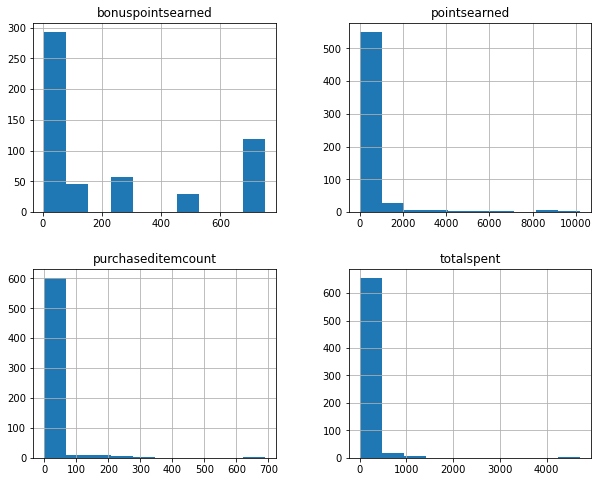

In [125]:
df_receipts_transactions.hist(figsize=(10,8))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fab5faf28e0>,
      dtype=object)

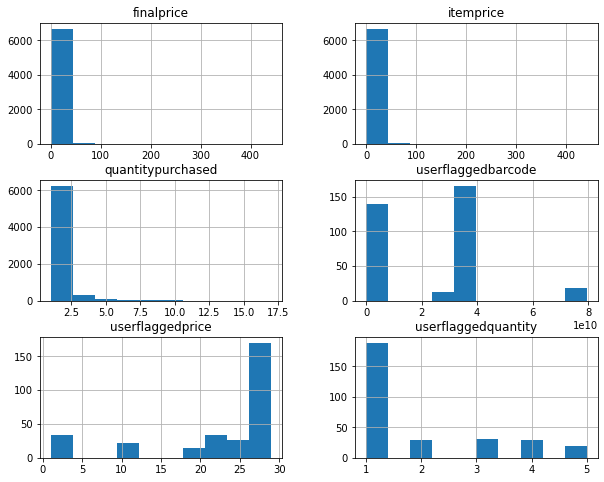

In [126]:
df_items_purchased.hist(figsize=(10,8))

### Creating a comprehensive Exploratory Data Analysis report for all dataframes using Pandas Profiling

### EDA Report on Users Data

In [4]:
df_users.profile_report()

### EDA Report on Brands Data

In [5]:
df_brands.profile_report()

### EDA Report of Receipt Transactions Data

In [12]:
df_receipts_transactions.profile_report()

### EDA Report of Items Purchased Data

In [11]:
df_items_purchased.profile_report()

### Changing the necessary column name before joining the dataframes

In [135]:
df_users.rename(columns={"user_id": "userid"},inplace=True)

### Merging the dataframes
###### Please note that the brands table was not joined with the other tables due to the inconsistency of the values in the barcode column

In [103]:
df_users_receipts = pd.merge(df_receipts_transactions,df_users,on='userid')

In [105]:
df_users_receipts_items = pd.merge(df_users_receipts,df_items_purchased,on='receiptid')

In [140]:
df_users_receipts_items.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15432 entries, 0 to 15431
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   receiptid                15432 non-null  object 
 1   bonuspointsearned        11297 non-null  float64
 2   bonuspointsearnedreason  11297 non-null  object 
 3   createdate               15432 non-null  object 
 4   datescanned              15432 non-null  object 
 5   finisheddate             12587 non-null  object 
 6   modifydate               15432 non-null  object 
 7   pointsawardeddate        11778 non-null  object 
 8   pointsearned             13681 non-null  float64
 9   purchasedate             15429 non-null  object 
 10  purchaseditemcount       14567 non-null  float64
 11  rewardsreceiptstatus     15432 non-null  object 
 12  totalspent               15432 non-null  float64
 13  userid                   15432 non-null  object 
 14  active                

### EDA Report on the combines dataframe

In [138]:
df_users_receipts_items.profile_report()

### --------------------------------------------------- END ----------------------------------------------------------------